In [1]:
%%capture
!pip install --upgrade albumentations==1.1.0
!echo "$(pip freeze | grep albumentations) is successfully installed"
# !pip install -U -q kaggle==1.5.8
!pip uninstall opencv-python -y
!pip install opencv-python==3.4.5.20

In [2]:
from google.colab import drive
drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **1. Download data from kaggle**

In [3]:
import warnings
warnings.filterwarnings("ignore")
import os
import sys

%reload_ext autoreload
%autoreload 2

project_path = "/content/drive/MyDrive/Neo-Unet"
sys.path.append(project_path)
%cd "/content/drive/MyDrive/Neo-Unet"
!cp -r /content/drive/MyDrive/Neo-Unet/data /content/data/
!pwd

from train import *
from model import *
import torch.utils.data as data
import torch.optim as optim
from data import make_datafile_path, DataTransform, MyDataset

/content/drive/.shortcut-targets-by-id/1BLjG0v2fB7zjj1yY7YIzN7JftczXoiJ3/Neo-Unet
/content/drive/.shortcut-targets-by-id/1BLjG0v2fB7zjj1yY7YIzN7JftczXoiJ3/Neo-Unet


# **Prepare dataset**

In [4]:
from sklearn.model_selection import train_test_split

tr_paths, te_paths = make_datafile_path('/content/')

tr_paths, val_paths = train_test_split(tr_paths, test_size=0.2, random_state=2021, shuffle=True)

input_size = (256, 256)
tr_dataset = MyDataset(tr_paths, "train", DataTransform(input_size))
val_dataset = MyDataset(val_paths, "val", DataTransform(input_size))

print("Số lượng tập train: {}".format(len(tr_dataset)))
print("Số lượng tập val: {}".format(len(val_dataset)))

BATCH_SIZE=8

tr_dataloader = data.DataLoader(
    tr_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_dataloader = data.DataLoader(
    val_dataset, batch_size=BATCH_SIZE, shuffle=False)

dataloader_dict = {
    "train": tr_dataloader,
    "val": val_dataloader
}

Số lượng tập train: 800
Số lượng tập val: 200


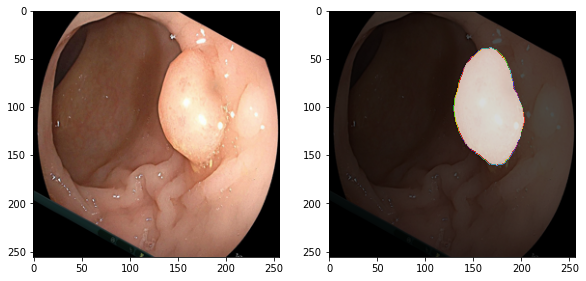

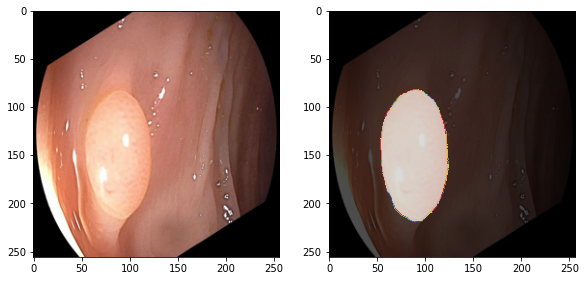

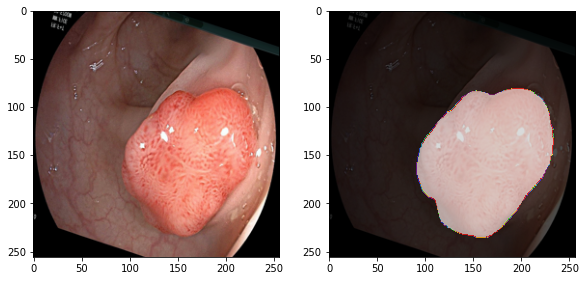

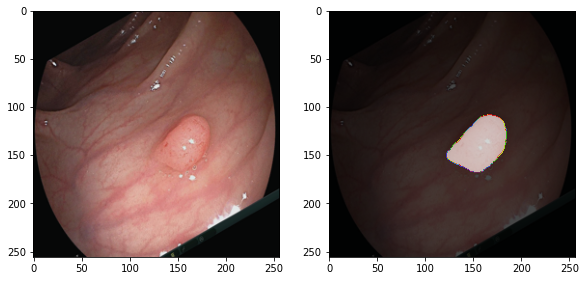

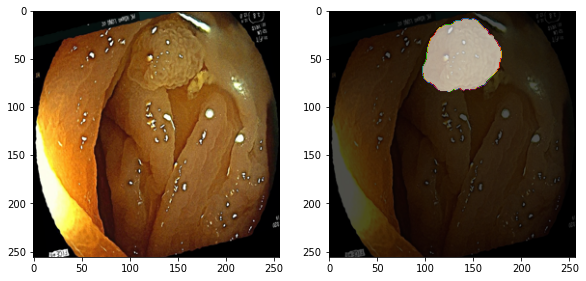

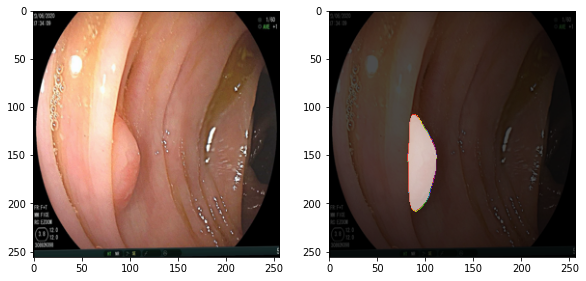

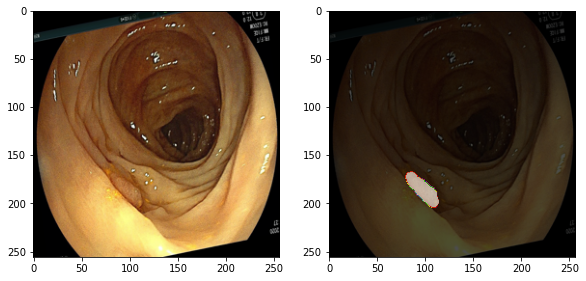

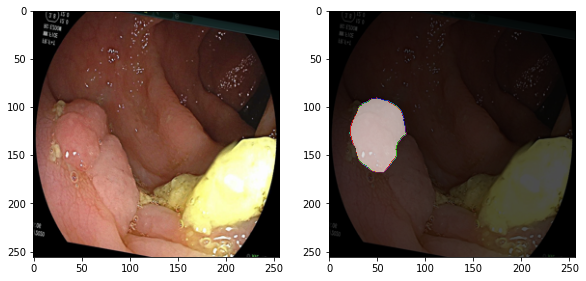

In [5]:
imgs, img_gts = next(iter(dataloader_dict["train"]))

def reverse_transform(inp):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    inp = (inp * 255).astype(np.uint8)

    return inp

for i in range(len(imgs)):
    img, img_gt = imgs[i], img_gts[i]
    img = img.numpy().transpose(1, 2, 0)
    img = reverse_transform(img)
    img_gt = img_gt.numpy().squeeze(0)
    plt.figure(figsize=(15, 8))
    plt.axis('off')
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.subplot(1, 3, 2)
    plt.imshow(img)
    plt.imshow(img_gt, alpha=0.7, cmap='nipy_spectral')
    plt.show()

# **Model, optimizer, loss**

In [6]:
# !pip install 'git+https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup'

In [14]:
# from cosine_annealing_warmup import CosineAnnealingWarmupRestarts

N_EPOCH = 100

checkpoint = torch.load('/content/drive/MyDrive/neounet_weights_30.pth.tar')

model = NeoUnet1()
model.load_state_dict(checkpoint['model_state_dict'])
optimizer = optim.AdamW(model.parameters(), lr=1e-4)
# optimizer = optim.SGD(model.parameters(), lr=1e-3, momentum=0.9, nesterov=True)
# scheduler = CosineAnnealingWarmupRestarts(optimizer,
#                                           first_cycle_steps=100,
#                                           cycle_mult=1.0,
#                                           max_lr=1e-3,
#                                           min_lr=1e-5,
#                                           warmup_steps=10,
#                                           gamma=1.0)
# summary(model.cuda(), (3, 256, 256))

Using cache found in /root/.cache/torch/hub/PingoLH_Pytorch-HarDNet_master


ImageNet pretrained weights for HarDNet68 is loaded


In [15]:
import torch.nn as nn
import torch
import numpy as np
import torch.nn.functional as f

################################### LOSS ###################################

def tversky_loss(y_pred, y_true, smooth=1e-5, alpha=0.3, beta=0.7):
  y_pred = y_pred.permute(1, 2, 3, 0).contiguous().reshape(2, -1)
  y_true = f.one_hot(y_true.squeeze(1).long(), num_classes=3).permute(3, 1, 2, 0).contiguous().reshape(3, -1) # C x H x W x N
  tp = (y_pred * y_true[1:]).sum(dim=1)
  fp = (y_pred * (1 - y_true[1:])).sum(dim=1)
  fn = ((1 - y_pred) * y_true[1:]).sum(dim=1)

  tversky_class = (tp + smooth) / (tp + alpha*fp + beta*fn + smooth)
  return (1 - tversky_class) # C x 1

def focal_tversky_loss(y_pred, y_true, gamma=3/4):
    return torch.mean(torch.sum(torch.pow(tversky_loss(y_pred, y_true), gamma)))

def multiclass_loss(y_pred, y_true):
    ft_loss = focal_tversky_loss(y_pred, y_true)
    y_true = f.one_hot(y_true.squeeze(1).long(), num_classes=3).permute(0, 3, 1, 2).contiguous()
    ce_loss = nn.BCELoss()(y_pred, y_true[:, 1:].float())
    return 0.5 * ce_loss + 0.5 * ft_loss


################################### METRIC ###################################

def iou_dice_score(y_pred, y_true, smooth=1e-5):
    y_pred[y_pred >= 0.5] = 1
    y_pred[y_pred < 0.5] = 0
    y_pred = y_pred.permute(1, 2, 3, 0).contiguous().reshape(2, -1)
    y_true = f.one_hot(y_true.squeeze(1).long(), num_classes=3).permute(3, 1, 2, 0).contiguous().reshape(3, -1) # C x H x W x N
    tp = (y_pred * y_true[1:]).sum(dim=1)
    fp = (y_pred * (1 - y_true[1:])).sum(dim=1)
    fn = ((1 - y_pred) * y_true[1:]).sum(dim=1)

    iou_class = (tp + smooth) / (tp + fp + fn  + smooth)
    dice_class = (2 * tp + smooth) / (2 * tp + fp + fn  + smooth)
    iou = torch.mean(iou_class)
    dice = torch.mean(dice_class)

    return iou, dice

In [16]:
def reverse_transform(inp):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    inp = (inp * 255).astype(np.uint8)

    return inp

def show_result(input, y_true, y_pred):
    input = reverse_transform(input.numpy().transpose(1, 2, 0))
    y_true = y_true.numpy().squeeze(0)
    new_pred = np.zeros((256, 256), dtype=np.uint8)
    new_pred[(y_pred[0] < 0.5) & (y_pred[1] < 0.5)] = 0
    new_pred[(y_pred[0] >= 0.5) & (y_pred[1] < 0.5)] = 1
    new_pred[(y_pred[0] < 0.5) & (y_pred[1] >= 0.5)] = 2
    new_pred[(y_pred[0] >= 0.5) & (y_pred[1] >= 0.5)] = np.argmax(y_pred, axis=0)[(y_pred[0] >= 0.5) & (y_pred[1] >= 0.5)] + 1
    plt.figure(figsize=(15, 8))
    plt.axis('off')
    plt.subplot(1,3,1)
    plt.imshow(input)
    plt.title("Input")
    plt.subplot(1, 3, 2)
    plt.imshow(input)
    plt.imshow(y_true, alpha=0.3, cmap='nipy_spectral')
    plt.title("target")
    plt.subplot(1, 3, 3)
    plt.imshow(input)
    plt.imshow(new_pred, alpha=0.3, cmap='nipy_spectral')
    plt.title("prediction")
    plt.show()

# **Train model**

In [17]:
def train_fn(model, dataloader_dict, optimizer, nEpoch, BATCH_SIZE):
    # all_train_loss, all_val_loss, all_train_dice, all_train_iou, all_val_dice, all_val_iou = [], [], [], [], [], []
    all_train_loss = checkpoint['train_loss']
    all_val_loss = checkpoint['val_loss']
    all_train_dice = checkpoint['train_dice']
    all_val_dice = checkpoint['val_dice']
    all_train_iou = checkpoint['train_iou']
    all_val_iou = checkpoint['val_iou']
    
    device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    for epoch in range(30, nEpoch):
        print("Epoch {}/{}".format(epoch+1, nEpoch))
        train_dice_score, train_iou_score = [], []
        val_dice_score, val_iou_score = [], []
        epoch_train_loss = 0.0
        epoch_val_loss = 0.0

        for phase in ["train", "val"]:
            n_batch = 0
            if phase == "train":
                model.train()
                print("\n###################################")
                print("[INFO] Training network")
                print("Train on {} samples".format(len(dataloader_dict["train"]) * BATCH_SIZE))
            else:
                model.eval()
                print("\n###################################")
                print("[INFO] Evaluation network")
                print("Eval on {} samples".format(len(dataloader_dict["val"]) * BATCH_SIZE))

            for inputs, targets in tqdm(dataloader_dict[phase]): 
                inputs = inputs.to(device).float()
                targets = targets.to(device)

                with torch.set_grad_enabled(phase=="train"):
                    y_pred = model(inputs)
                    loss = multiclass_loss(y_pred, targets)
                    score = iou_dice_score(y_pred.data.cpu(), targets.data.cpu())

                    if phase == "train":
                        optimizer.zero_grad()
                        loss.backward()
                        optimizer.step()
                        epoch_train_loss += loss.item()

                        if n_batch == 99:
                          with torch.no_grad():
                              for i in range(len(inputs)-6):
                                  show_result(inputs[i].cpu(), targets[i].cpu(), y_pred[i].cpu())

                        #####################
                        train_iou_score.append(score[0])
                        train_dice_score.append(score[1])
                        #####################
                    
                    else:
                        epoch_val_loss += loss.item()

                        #####################
                        val_iou_score.append(score[0])
                        val_dice_score.append(score[1])
                        #####################
                n_batch += 1

            if phase == "train":
                print("Training - loss: {:.4f}".format(epoch_train_loss / n_batch))
                print("Average Dice Score: {:.4f}".format(sum(train_dice_score)/ n_batch))
                print("Average IOU Score: {:.4f}".format(sum(train_iou_score) / n_batch))
                print("###################################")

                #####################
                all_train_loss.append(epoch_train_loss / n_batch)
                all_train_dice.append(sum(train_dice_score).item() / n_batch)
                all_train_iou.append(sum(train_iou_score).item() / n_batch)
                #####################
            else:
                print("Evaluation - loss: {:.4f}".format(epoch_val_loss / n_batch))
                print("Average Dice Score: {:.4f}".format(sum(val_dice_score) / n_batch))
                print("Average IOU Score: {:.4f}".format(sum(val_iou_score) / n_batch))
                print("###################################")

                #####################
                all_val_loss.append(epoch_val_loss / n_batch)
                all_val_dice.append(sum(val_dice_score).item() / n_batch)
                all_val_iou.append(sum(val_iou_score).item() / n_batch)
                #####################

        if ((epoch + 1) >= 5) and (((epoch + 1) % 5) == 0):
            torch.save({
                'epoch': epoch+1,
                'train_loss': all_train_loss,
                'val_loss': all_val_loss,
                'train_dice': all_train_dice,
                'val_dice': all_val_dice,
                'train_iou': all_train_iou,
                'val_iou': all_val_iou,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
            }, "/content/drive/MyDrive/weights/neounet_weights_{}.pth.tar".format(epoch+1))
            ##################### 
        if ((epoch+1) >= 5) and (((epoch+1) % 5) == 0):
            range_x = np.arange(epoch+1)
            plt.figure()
            plt.plot(range_x, all_train_loss, label="train_loss")
            plt.plot(range_x, all_val_loss, label="val_loss")
            plt.title("LOSS")
            plt.xlabel("Epoch #")
            plt.ylabel("Loss")
            plt.grid()
            plt.legend()
            plt.savefig("/content/drive/MyDrive/visualize/loss_{}.png".format(epoch+1))

            plt.figure()
            plt.plot(range_x, all_train_dice, label="train_dice")
            plt.plot(range_x, all_val_dice, label="val_dice")
            plt.title("DICE")
            plt.xlabel("Epoch #")
            plt.ylabel("Dice score")
            plt.grid()
            plt.legend()
            plt.savefig("/content/drive/MyDrive/visualize/dice_score_{}.png".format(epoch+1))

            plt.figure()
            plt.plot(range_x, all_train_iou, label="train_iou")
            plt.plot(range_x, all_val_iou, label="val_iou")
            plt.title("IOU")
            plt.xlabel("Epoch #")
            plt.ylabel("Iou score")
            plt.grid()
            plt.legend()
            plt.savefig("/content/drive/MyDrive/visualize/iou_score_{}.png".format(epoch+1))
        #####################

Epoch 31/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:24<00:05,  5.46s/it]

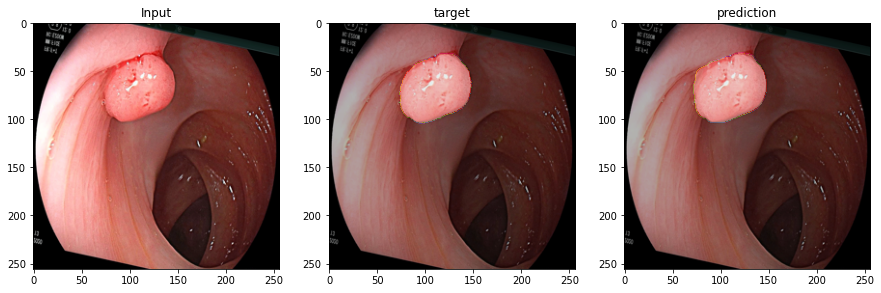

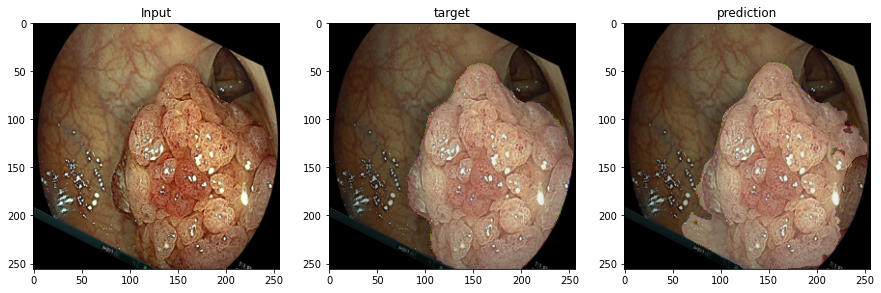

100%|██████████| 100/100 [09:31<00:00,  5.71s/it]


Training - loss: 0.2730
Average Dice Score: 0.8190
Average IOU Score: 0.7362
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:35<00:00,  1.41s/it]


Evaluation - loss: 0.4491
Average Dice Score: 0.6439
Average IOU Score: 0.5372
###################################
Epoch 32/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:24<00:05,  5.57s/it]

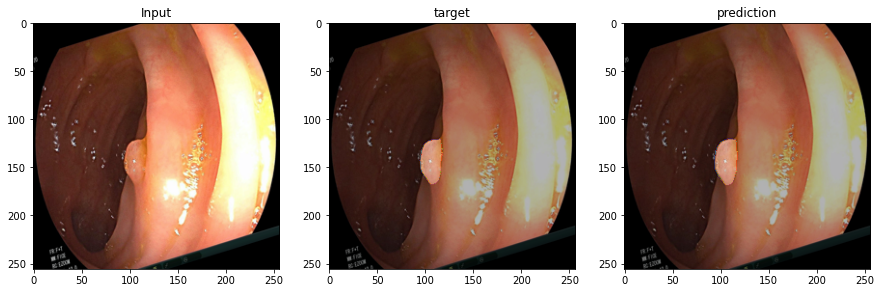

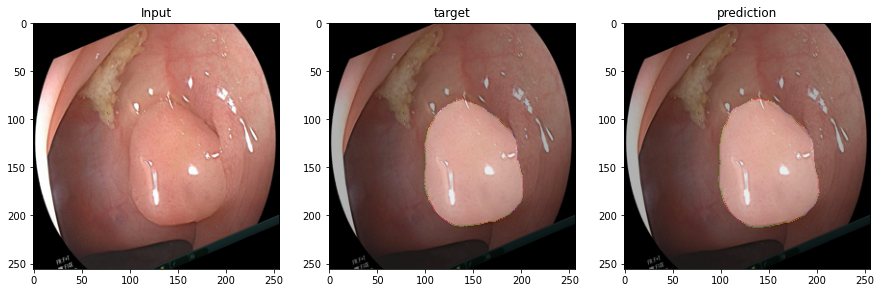

100%|██████████| 100/100 [09:31<00:00,  5.71s/it]


Training - loss: 0.2693
Average Dice Score: 0.8123
Average IOU Score: 0.7305
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:35<00:00,  1.40s/it]


Evaluation - loss: 0.4432
Average Dice Score: 0.6506
Average IOU Score: 0.5451
###################################
Epoch 33/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:10<00:05,  5.68s/it]

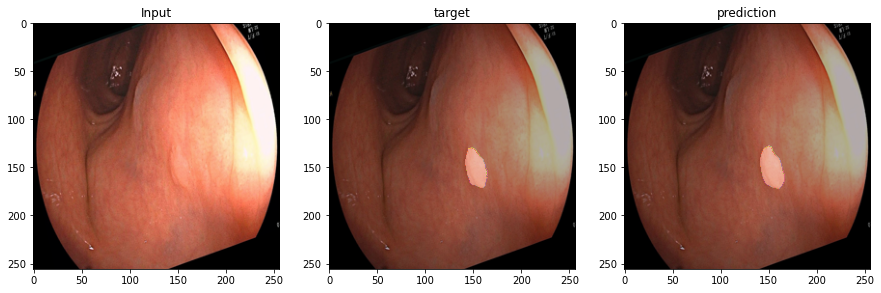

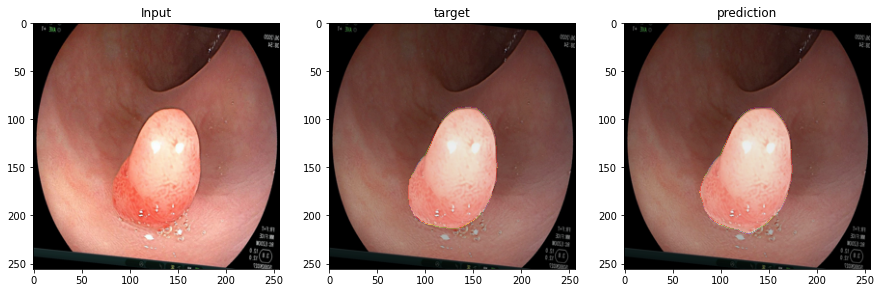

100%|██████████| 100/100 [09:17<00:00,  5.57s/it]


Training - loss: 0.2690
Average Dice Score: 0.8160
Average IOU Score: 0.7399
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:34<00:00,  1.40s/it]


Evaluation - loss: 0.4558
Average Dice Score: 0.6845
Average IOU Score: 0.5811
###################################
Epoch 34/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:12<00:05,  5.34s/it]

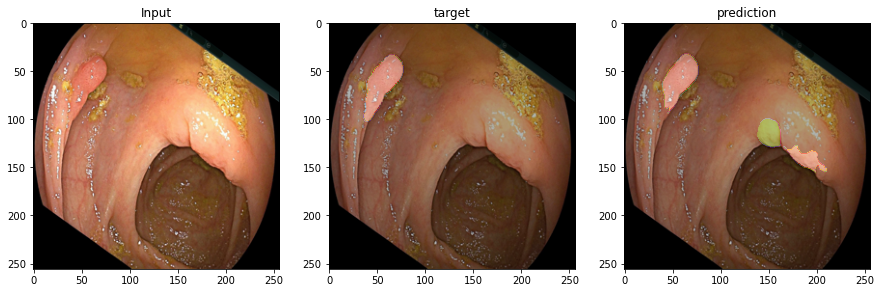

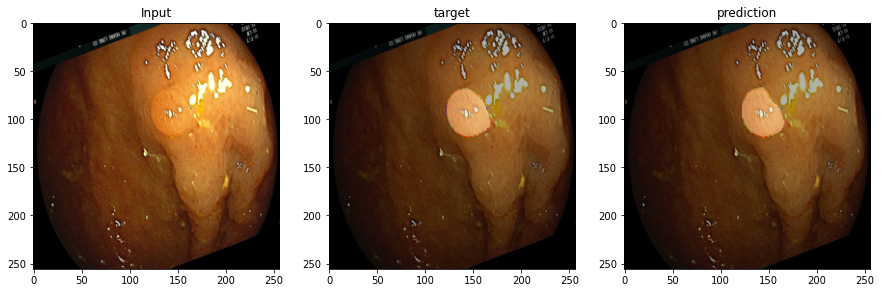

100%|██████████| 100/100 [09:18<00:00,  5.59s/it]


Training - loss: 0.2453
Average Dice Score: 0.8356
Average IOU Score: 0.7550
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:35<00:00,  1.40s/it]


Evaluation - loss: 0.4370
Average Dice Score: 0.6872
Average IOU Score: 0.5796
###################################
Epoch 35/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:08<00:05,  5.81s/it]

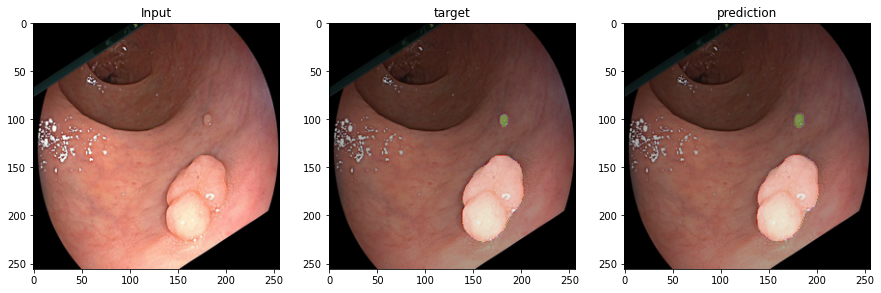

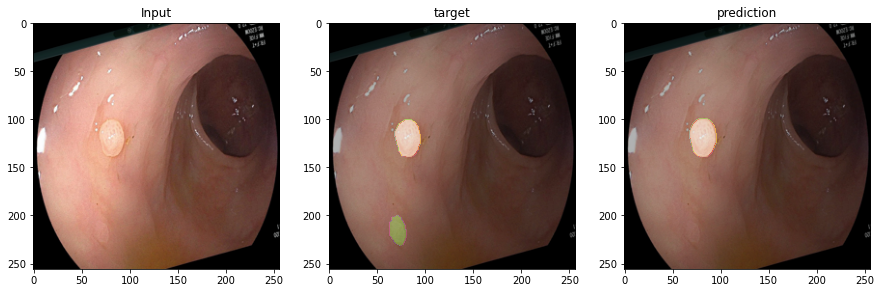

100%|██████████| 100/100 [09:15<00:00,  5.56s/it]


Training - loss: 0.2383
Average Dice Score: 0.8453
Average IOU Score: 0.7670
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:35<00:00,  1.41s/it]


Evaluation - loss: 0.4143
Average Dice Score: 0.7037
Average IOU Score: 0.6050
###################################
Epoch 36/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:15<00:05,  5.83s/it]

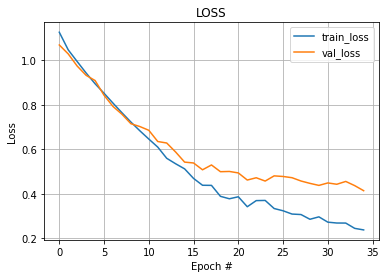

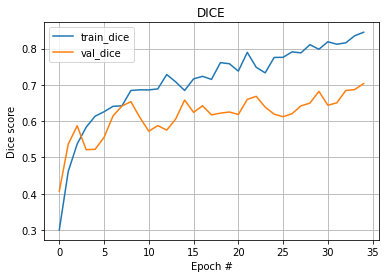

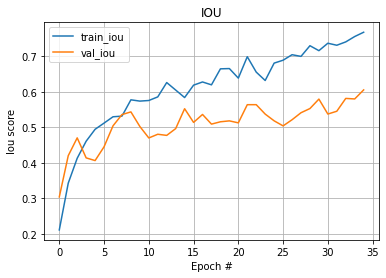

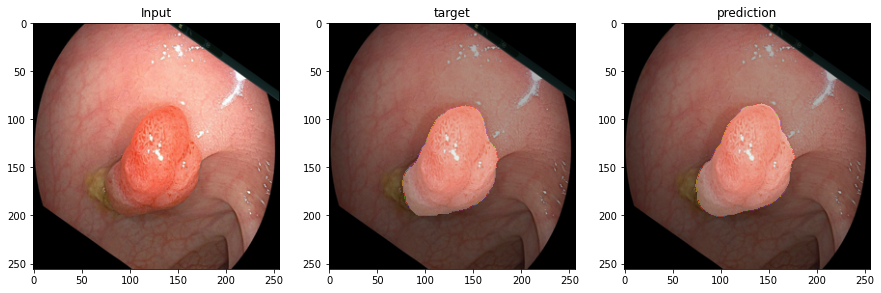

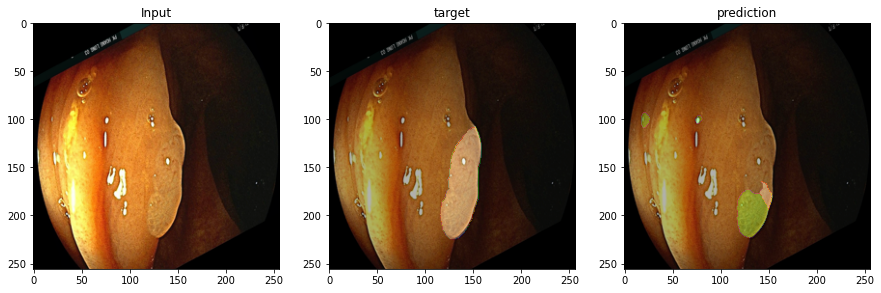

100%|██████████| 100/100 [09:23<00:00,  5.64s/it]


Training - loss: 0.2577
Average Dice Score: 0.8213
Average IOU Score: 0.7416
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:35<00:00,  1.42s/it]


Evaluation - loss: 0.4214
Average Dice Score: 0.6697
Average IOU Score: 0.5626
###################################
Epoch 37/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:17<00:05,  5.77s/it]

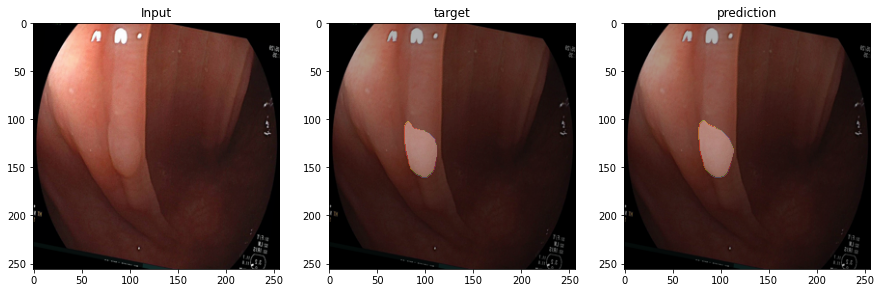

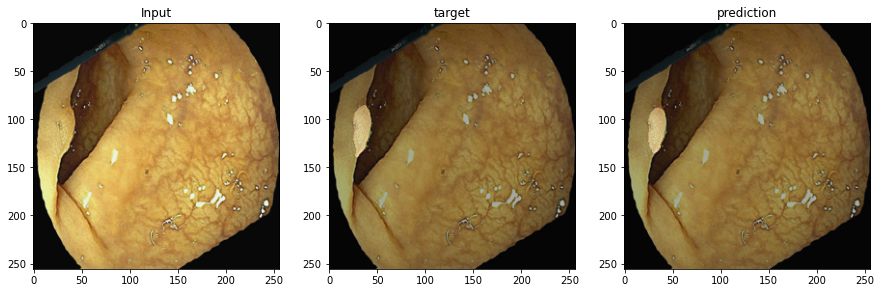

100%|██████████| 100/100 [09:24<00:00,  5.64s/it]


Training - loss: 0.2683
Average Dice Score: 0.8061
Average IOU Score: 0.7245
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:35<00:00,  1.42s/it]


Evaluation - loss: 0.4926
Average Dice Score: 0.6232
Average IOU Score: 0.5260
###################################
Epoch 38/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:19<00:05,  5.45s/it]

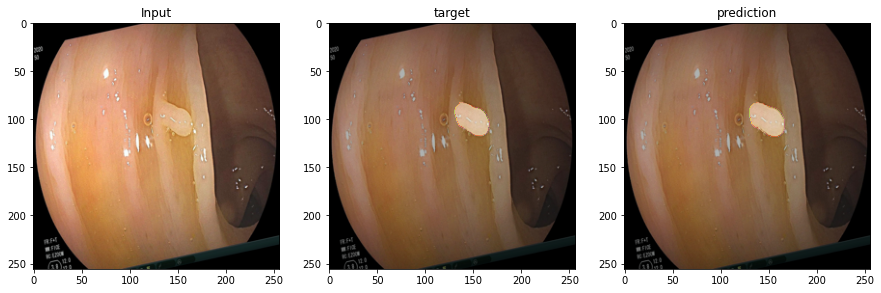

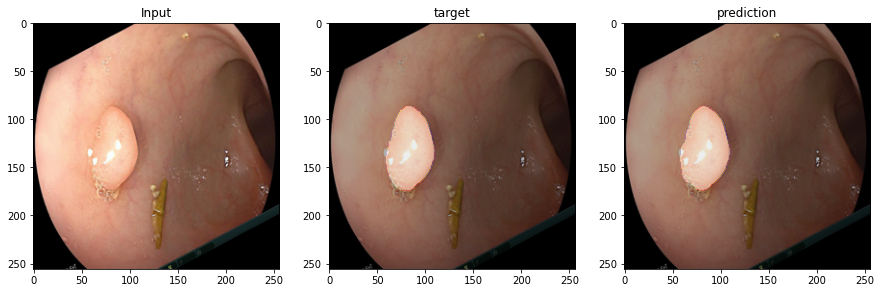

100%|██████████| 100/100 [09:26<00:00,  5.66s/it]


Training - loss: 0.2536
Average Dice Score: 0.8192
Average IOU Score: 0.7435
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:35<00:00,  1.42s/it]


Evaluation - loss: 0.4188
Average Dice Score: 0.6721
Average IOU Score: 0.5786
###################################
Epoch 39/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:21<00:05,  5.75s/it]

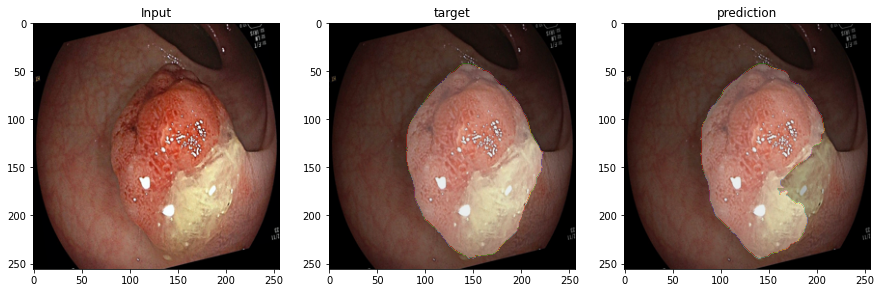

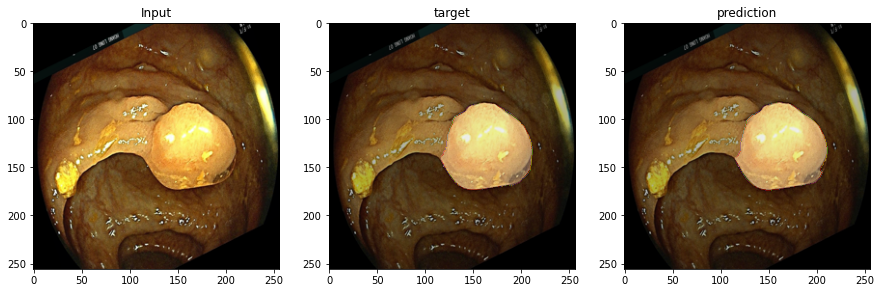

100%|██████████| 100/100 [09:28<00:00,  5.68s/it]


Training - loss: 0.2509
Average Dice Score: 0.8224
Average IOU Score: 0.7436
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.45s/it]


Evaluation - loss: 0.4141
Average Dice Score: 0.7232
Average IOU Score: 0.6291
###################################
Epoch 40/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:19<00:05,  5.48s/it]

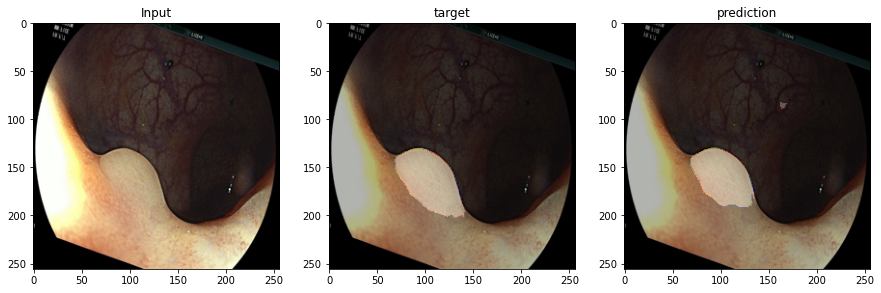

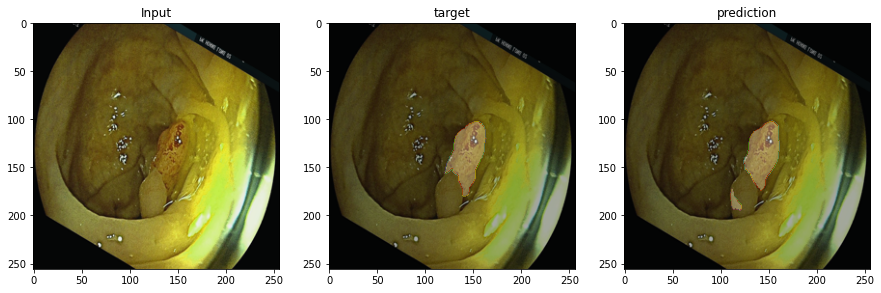

100%|██████████| 100/100 [09:25<00:00,  5.66s/it]


Training - loss: 0.2606
Average Dice Score: 0.8128
Average IOU Score: 0.7314
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:35<00:00,  1.44s/it]


Evaluation - loss: 0.4204
Average Dice Score: 0.6829
Average IOU Score: 0.5825
###################################
Epoch 41/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:23<00:05,  5.77s/it]

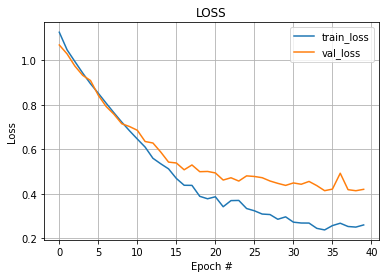

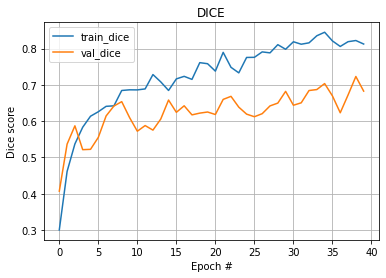

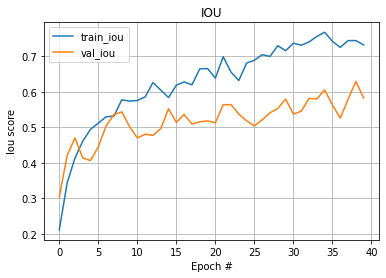

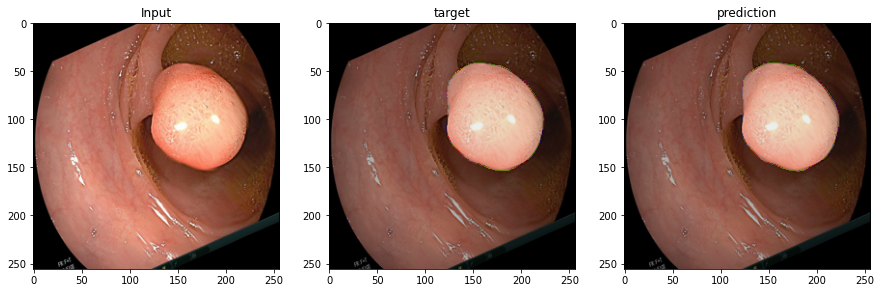

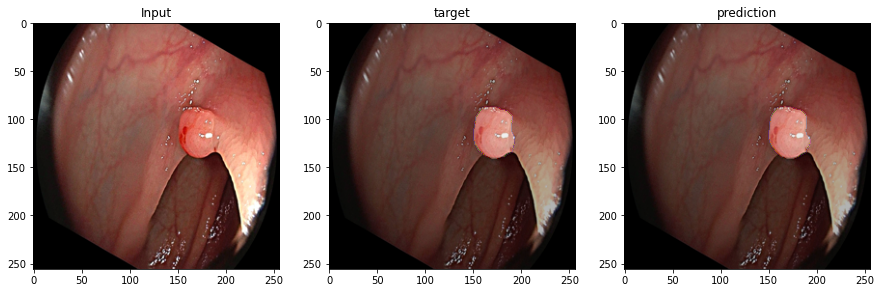

100%|██████████| 100/100 [09:31<00:00,  5.71s/it]


Training - loss: 0.2738
Average Dice Score: 0.8003
Average IOU Score: 0.7181
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.44s/it]


Evaluation - loss: 0.4225
Average Dice Score: 0.6721
Average IOU Score: 0.5699
###################################
Epoch 42/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:30<00:06,  6.42s/it]

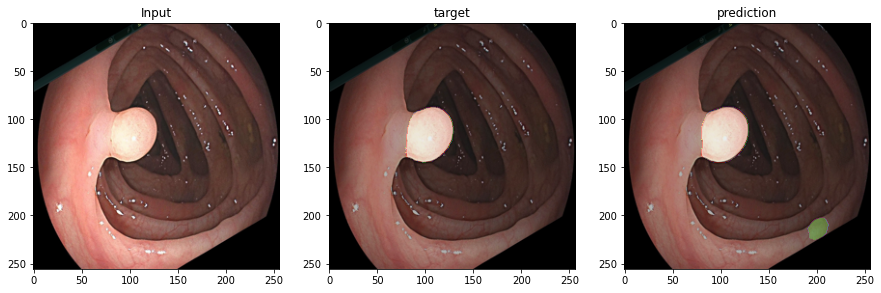

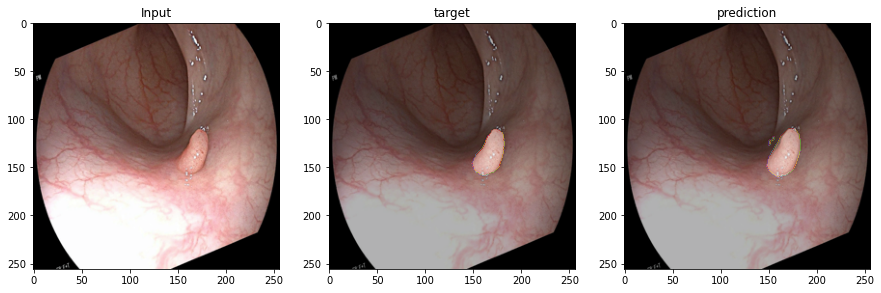

100%|██████████| 100/100 [09:38<00:00,  5.78s/it]


Training - loss: 0.2478
Average Dice Score: 0.8221
Average IOU Score: 0.7404
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.44s/it]


Evaluation - loss: 0.4438
Average Dice Score: 0.6483
Average IOU Score: 0.5453
###################################
Epoch 43/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:27<00:06,  6.04s/it]

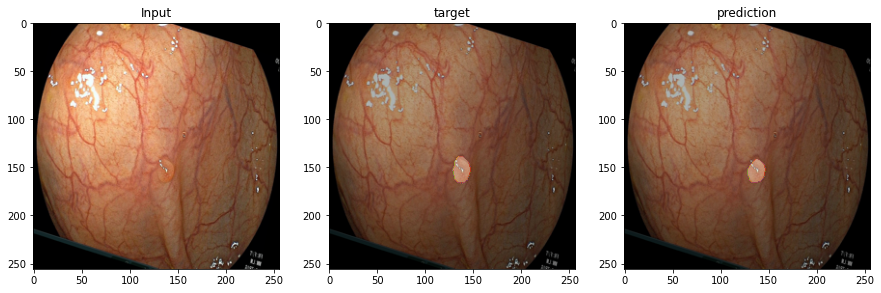

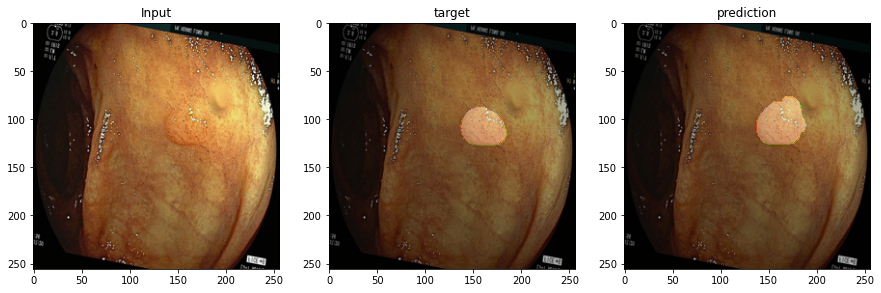

100%|██████████| 100/100 [09:35<00:00,  5.76s/it]


Training - loss: 0.2316
Average Dice Score: 0.8393
Average IOU Score: 0.7631
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.45s/it]


Evaluation - loss: 0.4216
Average Dice Score: 0.7193
Average IOU Score: 0.6222
###################################
Epoch 44/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:37<00:05,  5.87s/it]

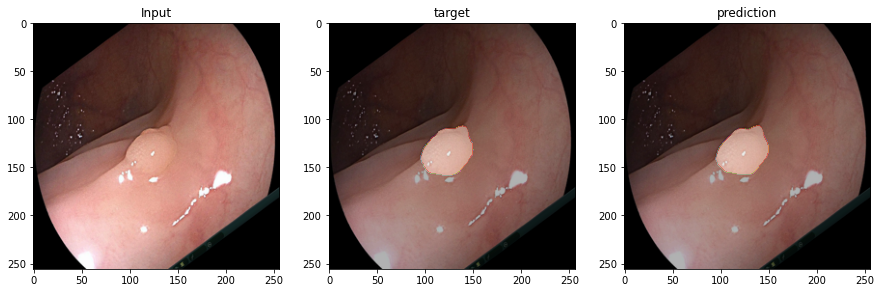

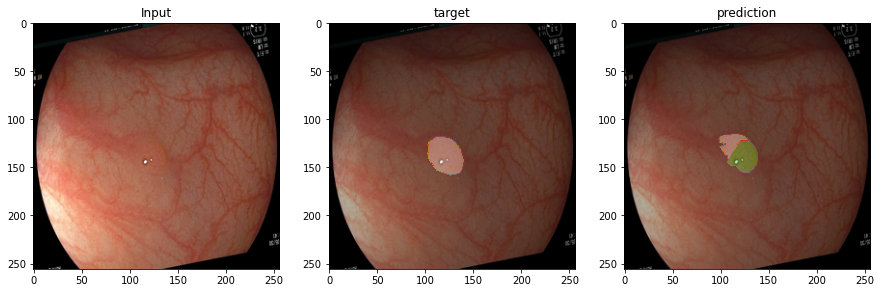

100%|██████████| 100/100 [09:43<00:00,  5.84s/it]


Training - loss: 0.2696
Average Dice Score: 0.8077
Average IOU Score: 0.7236
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.46s/it]


Evaluation - loss: 0.4291
Average Dice Score: 0.6844
Average IOU Score: 0.5821
###################################
Epoch 45/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:31<00:05,  5.93s/it]

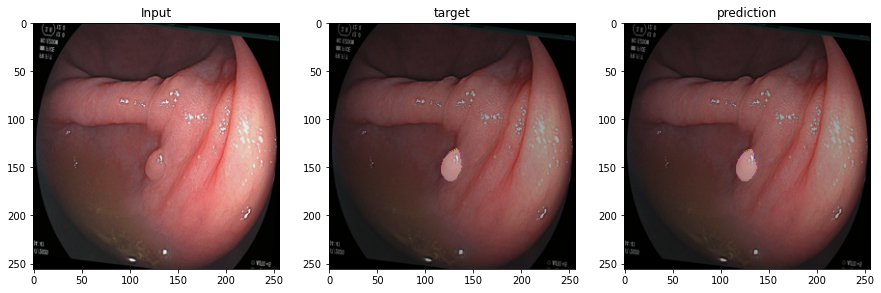

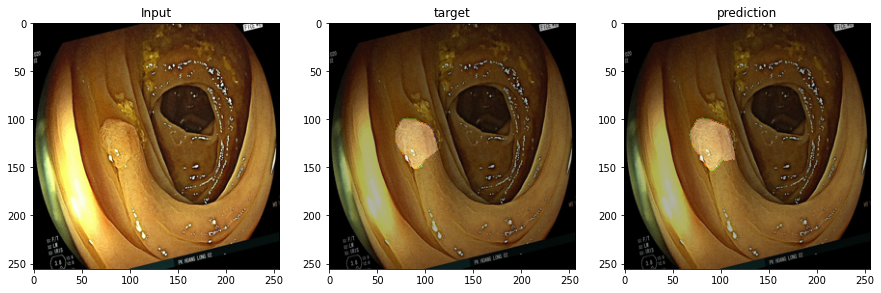

100%|██████████| 100/100 [09:38<00:00,  5.78s/it]


Training - loss: 0.2322
Average Dice Score: 0.8516
Average IOU Score: 0.7793
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.46s/it]


Evaluation - loss: 0.4354
Average Dice Score: 0.6723
Average IOU Score: 0.5740
###################################
Epoch 46/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:31<00:05,  5.50s/it]

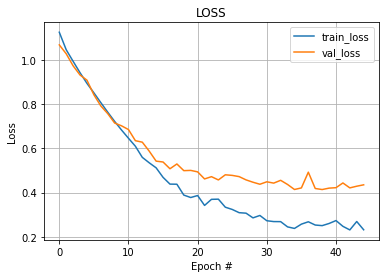

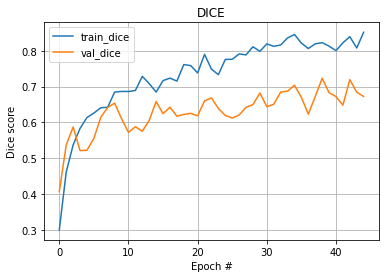

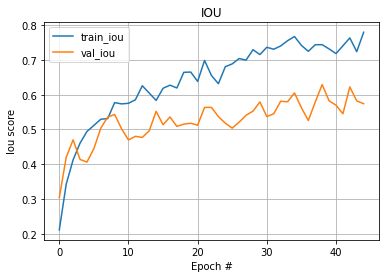

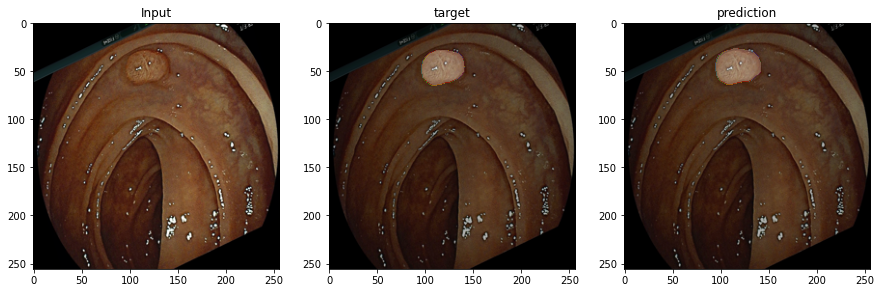

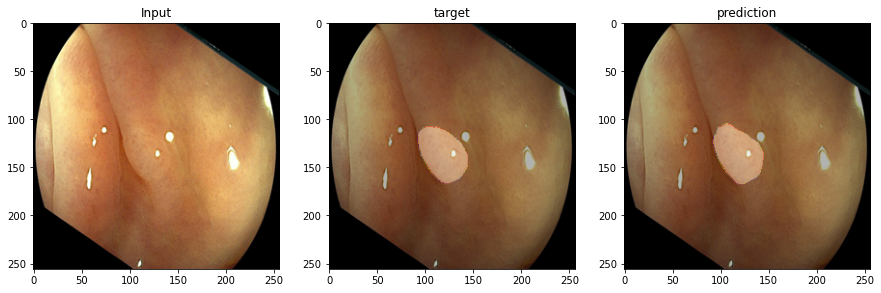

100%|██████████| 100/100 [09:38<00:00,  5.79s/it]


Training - loss: 0.2417
Average Dice Score: 0.8247
Average IOU Score: 0.7464
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.46s/it]


Evaluation - loss: 0.4519
Average Dice Score: 0.6403
Average IOU Score: 0.5540
###################################
Epoch 47/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:20<00:05,  5.55s/it]

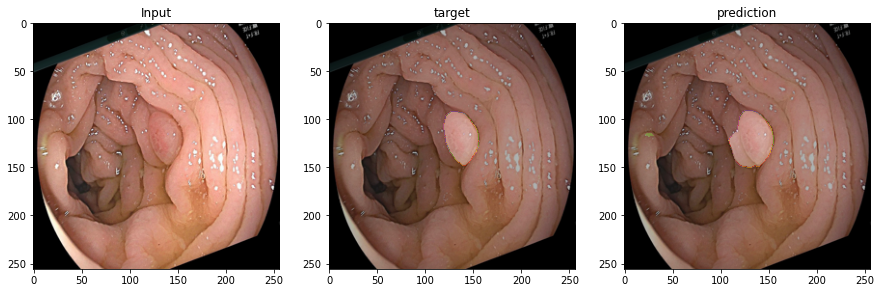

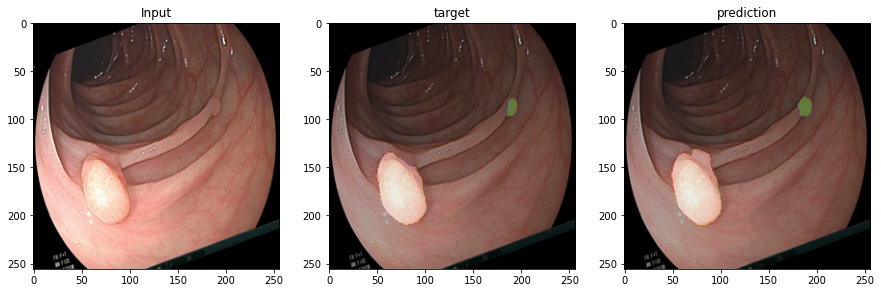

100%|██████████| 100/100 [09:27<00:00,  5.68s/it]


Training - loss: 0.2211
Average Dice Score: 0.8527
Average IOU Score: 0.7817
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.46s/it]


Evaluation - loss: 0.4312
Average Dice Score: 0.6522
Average IOU Score: 0.5619
###################################
Epoch 48/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:20<00:06,  6.14s/it]

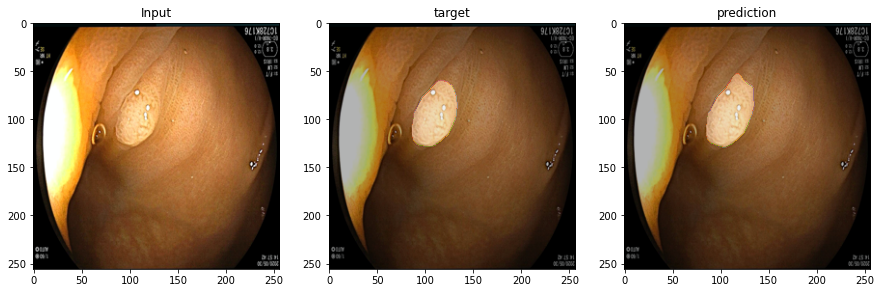

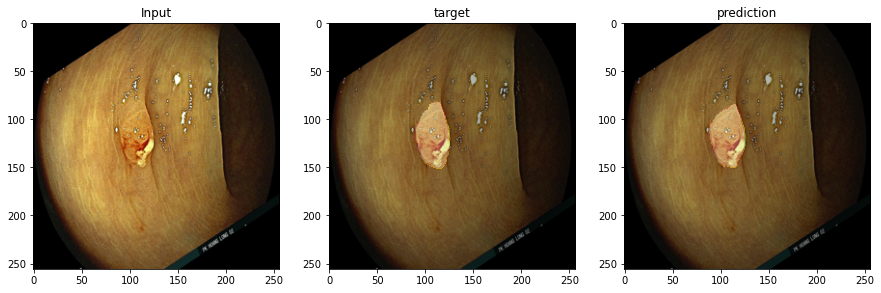

100%|██████████| 100/100 [09:27<00:00,  5.67s/it]


Training - loss: 0.2153
Average Dice Score: 0.8490
Average IOU Score: 0.7857
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.45s/it]


Evaluation - loss: 0.4481
Average Dice Score: 0.6425
Average IOU Score: 0.5409
###################################
Epoch 49/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:09<00:05,  5.41s/it]

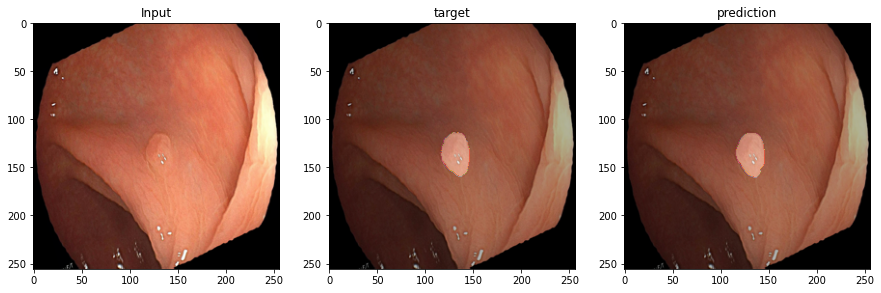

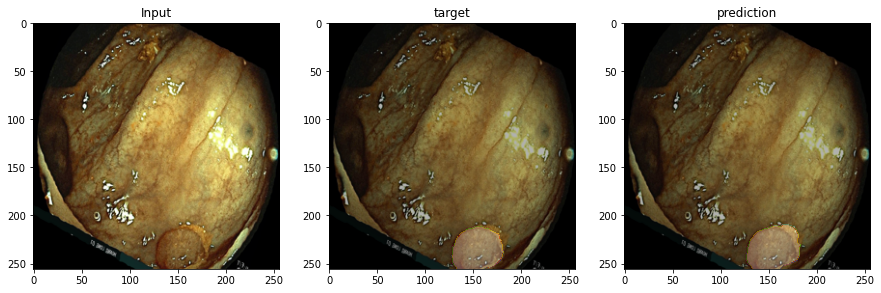

100%|██████████| 100/100 [09:18<00:00,  5.58s/it]


Training - loss: 0.2324
Average Dice Score: 0.8400
Average IOU Score: 0.7641
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.48s/it]


Evaluation - loss: 0.4679
Average Dice Score: 0.6371
Average IOU Score: 0.5350
###################################
Epoch 50/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:11<00:05,  5.44s/it]

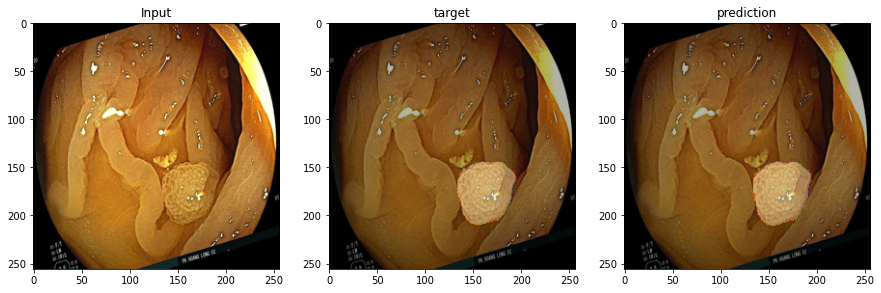

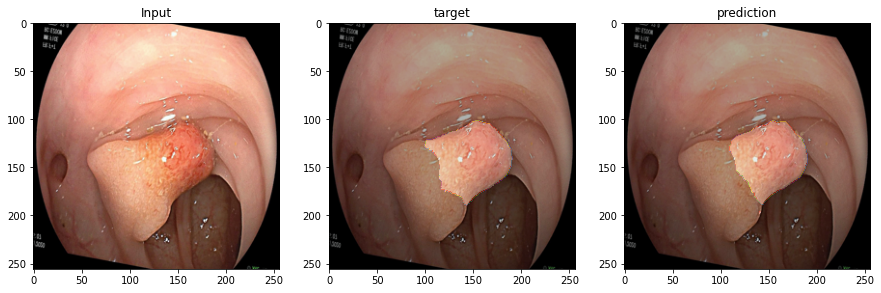

100%|██████████| 100/100 [09:17<00:00,  5.58s/it]


Training - loss: 0.2350
Average Dice Score: 0.8545
Average IOU Score: 0.7742
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.44s/it]


Evaluation - loss: 0.4378
Average Dice Score: 0.6499
Average IOU Score: 0.5450
###################################
Epoch 51/100

###################################
[INFO] Training network
Train on 800 samples


 99%|█████████▉| 99/100 [09:34<00:05,  5.93s/it]

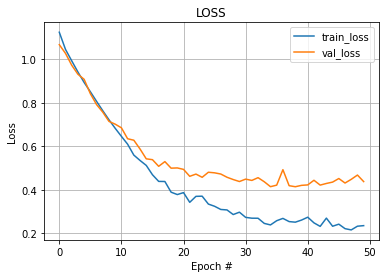

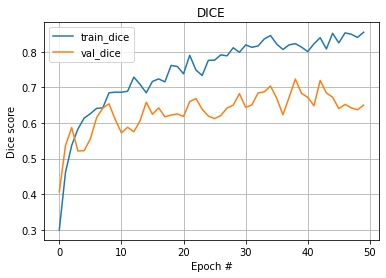

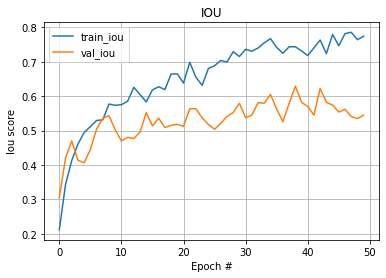

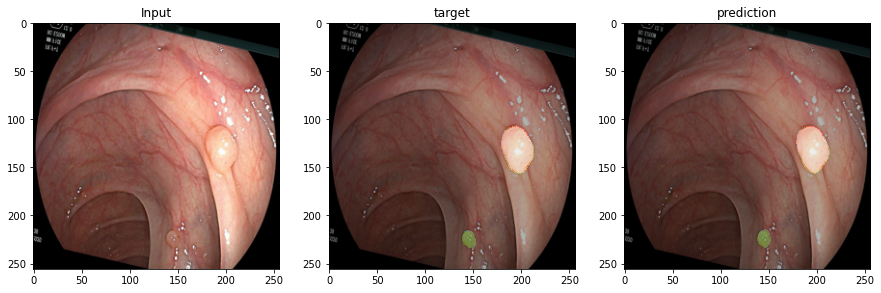

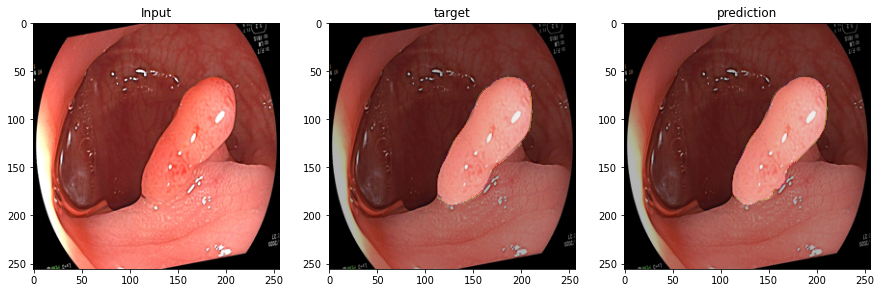

100%|██████████| 100/100 [09:41<00:00,  5.81s/it]


Training - loss: 0.2144
Average Dice Score: 0.8561
Average IOU Score: 0.7865
###################################

###################################
[INFO] Evaluation network
Eval on 200 samples


100%|██████████| 25/25 [00:36<00:00,  1.46s/it]


Evaluation - loss: 0.4463
Average Dice Score: 0.6592
Average IOU Score: 0.5645
###################################
Epoch 52/100

###################################
[INFO] Training network
Train on 800 samples


 57%|█████▋    | 57/100 [05:21<04:05,  5.70s/it]

In [ ]:
train_fn(model, dataloader_dict, optimizer, N_EPOCH, BATCH_SIZE)

In [ ]:
train_fn(model, dataloader_dict, optimizer, scheduler, N_EPOCH, BATCH_SIZE)

In [ ]:
scheduler.optimizer.param_groups[0]['lr']

In [ ]:
assert 2==3

In [ ]:
train_fn(model, dataloader_dict, optimizer, scheduler, N_EPOCH, BATCH_SIZE)

# **Test on test data**

In [ ]:
import torch
checkpoint = torch.load("/content/drive/MyDrive/Neo-Unet/weights/neounet_weights_90.pth.tar")
model = NeoUnet(input_size=(256, 256))
model.cuda()
model.load_state_dict(checkpoint['model_state_dict'])

In [ ]:
from utils.preprocess import preprocess

In [ ]:
model.eval()

In [ ]:
!pip install opencv-python

In [ ]:
te_paths

In [ ]:
# def visualize(input, out):
#     input = input.cpu().numpy().transpose(1, 2, 0)
#     input = reverse_transform(input)
#     pred = torch.permute(out.cpu(), (1, 2, 0)).contiguous().numpy()
#     pred1 = pred[:, :, 0].squeeze()
#     pred2 = pred[:, :, 1].squeeze()
#     pred1[pred1 >= 0.5] = 1
#     pred1[pred1 < 0.5] = 0
#     pred2[pred2 >= 0.5] = 2
#     pred2[pred2 < 0.5] = 0
#     pred = cv2.bitwise_or(pred1, pred2)
#     plt.figure(figsize=(15, 8))
#     plt.axis('off')
#     plt.subplot(1,2,1)
#     plt.imshow(input)
#     plt.title("Input")
#     plt.subplot(1, 2, 2)
#     plt.imshow(input)
#     plt.imshow(pred, alpha=0.3, cmap='nipy_spectral')
#     plt.title("prediction")
#     plt.show()
import cv2

def process_output(out, path):
    pred = torch.permute(out.cpu(), (1, 2, 0)).contiguous().numpy()
    pred1 = pred[:, :, 0]
    pred2 = pred[:, :, 1]
    pred1[pred1 >= 0.5] = 255 # green
    pred1[pred1 < 0.5] = 0
    pred2[pred2 >= 0.5] = 255 # red
    pred2[pred2 < 0.5] = 0
    background = pred1 * 0
    green = np.expand_dims(pred1, axis=-1)
    red = np.expand_dims(pred2, axis=-1)
    background = np.expand_dims(background, axis=-1)
    pred = np.concatenate((background, green, red), axis=-1)
    cv2.imwrite('/content/drive/MyDrive/output/{}'.format(path.split('/')[-1]), pred)
    
for i, img_path in enumerate(te_paths):
    img = preprocess(img_path, input_size=(256, 256))
    img = img.unsqueeze(0)
    img = img.cuda()
    img_pred = model(img)
    process_output(img_pred[0].detach(), te_paths[i])

In [ ]:
!rm -r /content/drive/MyDrive/output

In [ ]:
!cp -r /content/data/data/output /content/drive/MyDrive/output

In [ ]:
import numpy as np
import pandas as pd
import cv2
import os

def rle_to_string(runs):
    return ' '.join(str(x) for x in runs)

def rle_encode_one_mask(mask):
    pixels = mask.flatten()
    pixels[pixels > 0] = 255
    use_padding = False
    if pixels[0] or pixels[-1]:
        use_padding = True
        pixel_padded = np.zeros([len(pixels) + 2], dtype=pixels.dtype)
        pixel_padded[1:-1] = pixels
        pixels = pixel_padded
    
    rle = np.where(pixels[1:] != pixels[:-1])[0] + 2
    if use_padding:
        rle = rle - 1
    rle[1::2] = rle[1::2] - rle[:-1:2]
    return rle_to_string(rle)

def rle2mask(mask_rle, shape=(3,3)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

def mask2string(dir):
    ## mask --> string
    strings = []
    ids = []
    ws, hs = [[] for i in range(2)]
    for image_id in os.listdir(dir):
        id = image_id.split('.')[0]
        path = os.path.join(dir, image_id)
        print(path)
        img = cv2.imread(path)[:,:,::-1]
        h, w = img.shape[0], img.shape[1]
        for channel in range(2):
            ws.append(w)
            hs.append(h)
            ids.append(f'{id}_{channel}')
            string = rle_encode_one_mask(img[:,:,channel])
            strings.append(string)
    r = {
        'ids': ids,
        'strings': strings,
    }
    return r


MASK_DIR_PATH = '/content/drive/MyDrive/output' # change this to the path to your output mask folder
dir = MASK_DIR_PATH
res = mask2string(dir)
df = pd.DataFrame(columns=['Id', 'Expected'])
df['Id'] = res['ids']
df['Expected'] = res['strings']

df.to_csv(r'/content/drive/MyDrive/output1.csv', index=False)